<a href="https://colab.research.google.com/github/ejkan/ai-660710698/blob/main/regularization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
# Import dependencies
import tensorflow as tf
from tensorflow.keras import layers, models, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import numpy as np

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.model_selection import train_test_split

In [8]:
# Variable assignments
IMG_ROWS = 28
IMG_COLS = 28
NUM_CLASSES = 10
VAL_SIZE = 0.2
RANDOM_STATE = 99
BATCH_SIZE = 100

In [9]:
# Dataset importing
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

In [10]:
# Data scaling between 0 to 1

# แปลงชนิดข้อมูลเป็น float32 เพื่อให้รองรับค่าทศนิยม
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# ทำ Scaling โดยการหารด้วย 255
x_train /= 255.0
x_test /= 255.0

In [11]:
# Encripting results with One-Hot encoding

y_train = tf.keras.utils.to_categorical(y_train, NUM_CLASSES)
y_test = tf.keras.utils.to_categorical(y_test, NUM_CLASSES)

y_train[0]

array([0., 0., 0., 0., 0., 0., 1., 0., 0., 0.])

In [12]:
# Spliting Train and Validation Datasets
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=VAL_SIZE, random_state=RANDOM_STATE)

In [13]:
# Output the datasets

print(f"x_train shape {x_train.shape}")
print(f"y_train shape {y_train.shape}")
print(f"x_val shape {x_val.shape}")
print(f"y_val shape {y_val.shape}")
print(f"x_test shape {x_test.shape}")
print(f"y_test shape {y_test.shape}")

x_train shape (40000, 32, 32, 3)
y_train shape (40000, 10)
x_val shape (10000, 32, 32, 3)
y_val shape (10000, 10)
x_test shape (10000, 32, 32, 3)
y_test shape (10000, 10)


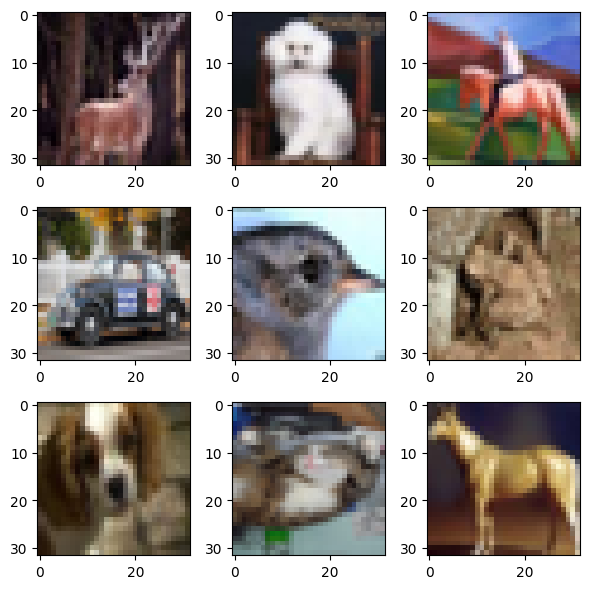

In [14]:
# Plotting Train dataset

# กำหนดขนาดรูปภาพ
plt.figure(figsize=(6, 6))

for i in range(9):
    # สร้าง subplot ในตารางขนาด 3x3 ตำแหน่งที่ i+1
    plt.subplot(3, 3, i + 1)

    # แสดงรูปภาพ
    plt.imshow(x_train[i])

plt.tight_layout() # จัด layout ให้สวยงามอัตโนมัติ
plt.show()

In [16]:
# Model defining

input_shape=(32, 32, 3)
inputs = Input(shape=input_shape)

# Feature Extraction Layers
x = layers.Conv2D(32, (3, 3), activation='relu')(inputs)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)

# Classification Layers
x = layers.Flatten()(x)
x = layers.Dense(64, activation='relu')(x)

# กำหนด Output Layer
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

# ประกาศว่าโมเดลนี้มีจุดเริ่มต้น (inputs) และจุดสิ้นสุด (outputs)
model = models.Model(inputs=inputs, outputs=outputs)

In [18]:
# Model compiling

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [19]:
# Training model

EPOCHS = 20

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - accuracy: 0.3245 - loss: 1.8385 - val_accuracy: 0.5108 - val_loss: 1.3734
Epoch 2/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5259 - loss: 1.3339 - val_accuracy: 0.5766 - val_loss: 1.1959
Epoch 3/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5881 - loss: 1.1664 - val_accuracy: 0.6069 - val_loss: 1.1151
Epoch 4/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6271 - loss: 1.0681 - val_accuracy: 0.6459 - val_loss: 1.0275
Epoch 5/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6544 - loss: 0.9894 - val_accuracy: 0.6513 - val_loss: 0.9987
Epoch 6/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6764 - loss: 0.9343 - val_accuracy: 0.6459 - val_loss: 1.0138
Epoch 7/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6929 - loss: 0.8838 - val_accuracy: 0.6720 - val_loss: 0.9499
Epoch 8/20
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7113 - loss: 0.8315 - val_accuracy: 0.

In [20]:
# Graph plotting

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()

In [21]:
# Image Augmentation

# Importing and Plotting specific image file

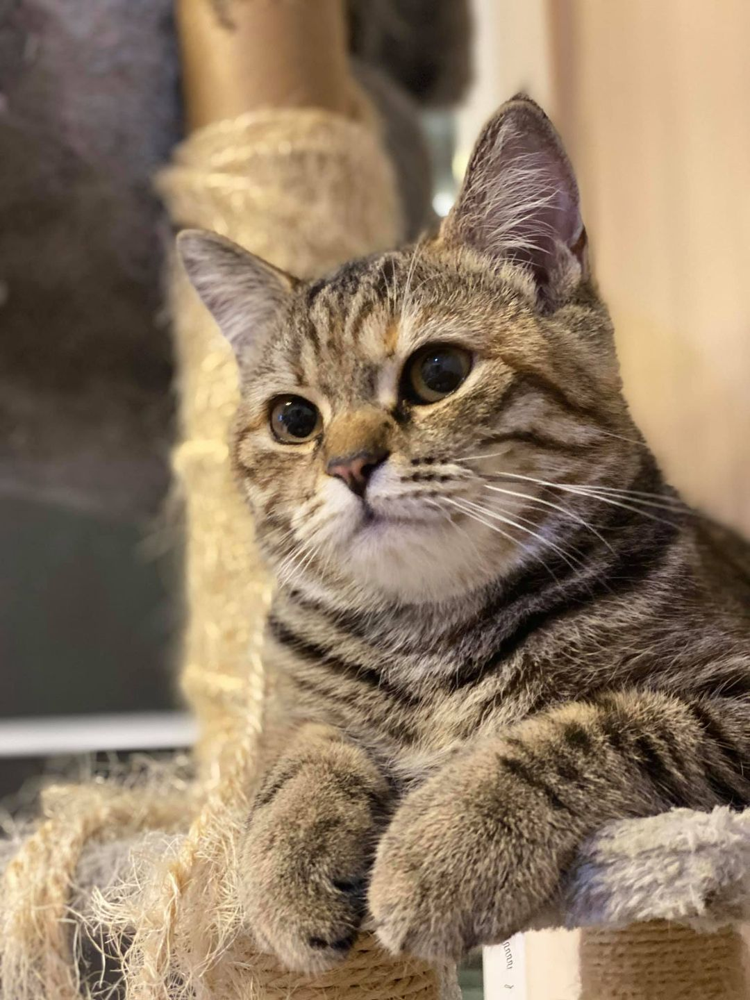

In [22]:
cat = load_img('/content/drive/MyDrive/cat.jpg')
cat

In [23]:
# Converting to array (h, w, c)

img_array = img_to_array(cat)
img_array.shape

(1440, 1080, 3)

In [24]:
# Adding Batch Dimensions (จาก (H, W, C) -> (1, H, W, C))
img_batch = tf.expand_dims(img_array, 0)
img_batch.shape

TensorShape([1, 1440, 1080, 3])

In [26]:
# Vertical Shift method

# height_factor=0.2 เลื่อนขึ้น/ลงได้ไม่เกิน 20% ของความสูงภาพ
vertical_shift_layer = tf.keras.layers.RandomTranslation(
    height_factor=0.2,
    width_factor=0.0, # ไม่มีการเลื่อนในแนวนอน
    fill_mode='reflect'
)

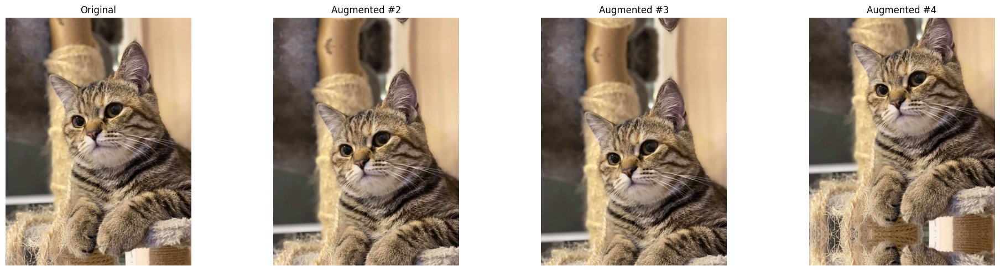

In [27]:
# Show the results

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

# แสดงภาพที่ผ่าน Augmentation 3 ครั้ง
for i in range(1, 4):
    # ส่งภาพ (ที่เป็น Batch) ผ่าน Layer ที่เราสร้างไว้
    augmented_batch = vertical_shift_layer(img_batch)

    # แปลง Tensor กลับเป็นภาพที่แสดงผลได้ (Numpy array ชนิด uint8)
    # และเลือกภาพแรกจาก Batch (index [0])
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented #{i+1}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

In [28]:
# Horizontial Shift method

horizontal_shift_layer = tf.keras.layers.RandomTranslation(
    height_factor=0.0, # ไม่มีการเลื่อนในแนวตั้ง
    width_factor=0.2,
    fill_mode='reflect'
)

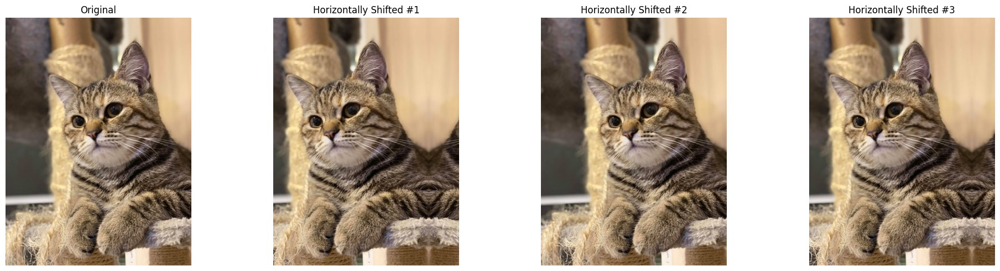

In [29]:
# Show the results

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = horizontal_shift_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Horizontally Shifted #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

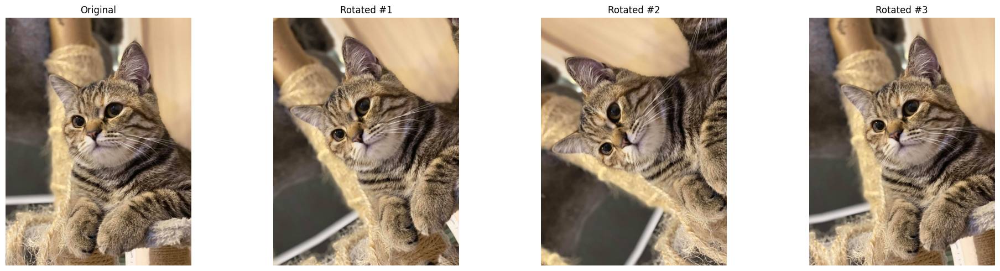

In [32]:
# Randomised not greater than 30 degrees image rotating

rotation_layer = tf.keras.layers.RandomRotation(
    factor=0.2,  # Randomly rotate by a factor of up to 20% of 360 degrees (72 degrees)
    fill_mode='reflect'
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = rotation_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Rotated #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

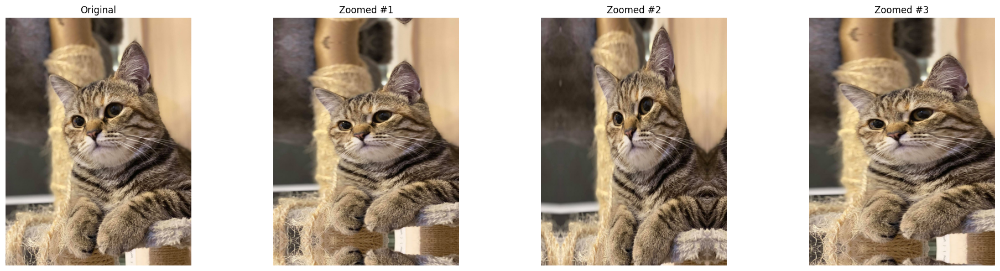

In [34]:
# Randomised not greater than 30% image zooming

zoom_layer = tf.keras.layers.RandomZoom(
    height_factor=0.3, # Randomly zoom in/out by up to 30% vertically
    width_factor=0.3,  # Randomly zoom in/out by up to 30% horizontally
    fill_mode='reflect'
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = zoom_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Zoomed #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

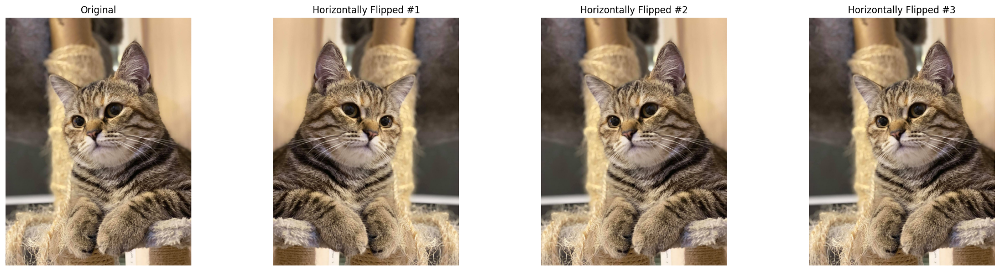

In [35]:
# Randomised horizontal flipping

horizontal_flip_layer = tf.keras.layers.RandomFlip(
    mode='horizontal'  # Randomly flip images horizontally
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = horizontal_flip_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Horizontally Flipped #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

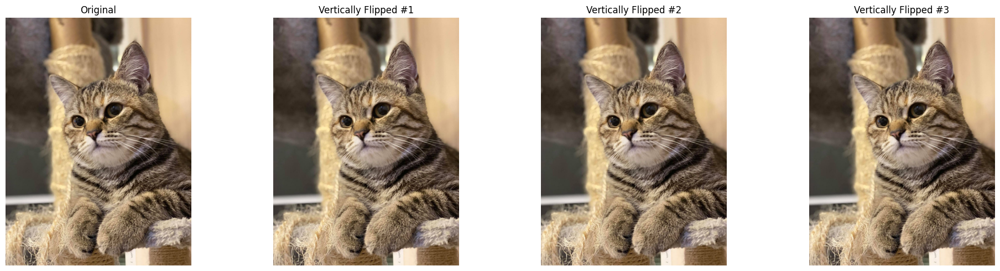

In [36]:
# Randomised vertical flipping

vertical_flip_layer = tf.keras.layers.RandomFlip(
    mode='vertical'  # Randomly flip images vertically
)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = vertical_flip_layer(img_batch)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()

    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Vertically Flipped #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

In [37]:
# Fill Mode

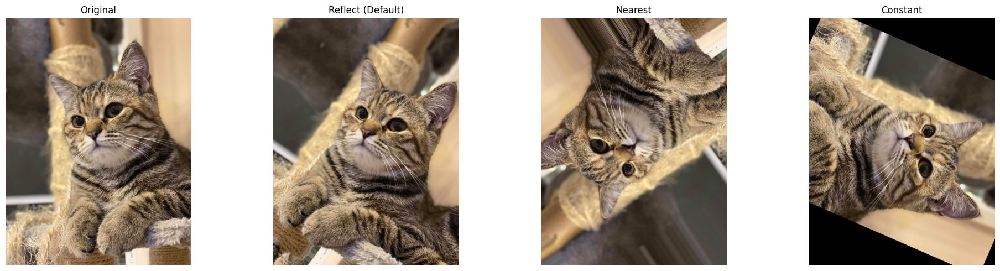

In [38]:
# Image filling

# reflect ค่า Default ของ API
reflect_layer = tf.keras.layers.RandomRotation(factor=0.4, fill_mode='reflect')

nearest_layer = tf.keras.layers.RandomRotation(factor=0.4, fill_mode='nearest')

# 'constant' (เติมด้วยค่าคงที่ ในที่นี้คือสีดำ)
constant_layer = tf.keras.layers.RandomRotation(factor=0.4, fill_mode='constant')

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))

# แสดงภาพต้นฉบับ
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

# แสดงภาพที่เติมขอบแบบต่างๆ
titles = ['Reflect (Default)', 'Nearest', 'Constant']
layers = [reflect_layer, nearest_layer, constant_layer]

for i in range(3):
    augmented_batch = layers[i](img_batch, training=True) # training=True เพื่อให้เกิดการสุ่ม
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i+1].imshow(augmented_image)
    ax[i+1].set_title(titles[i])
    ax[i+1].axis('off')

plt.tight_layout()
plt.show()

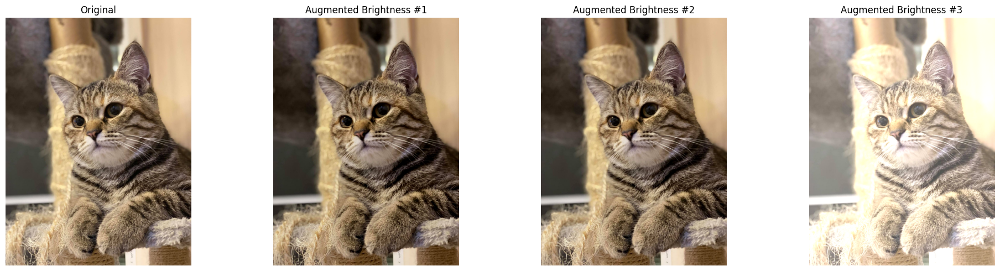

In [39]:
# Randomised brightness

# Layer สำหรับ Random Brightness
brightness_layer = tf.keras.layers.RandomBrightness(factor=0.4)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = brightness_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Brightness #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

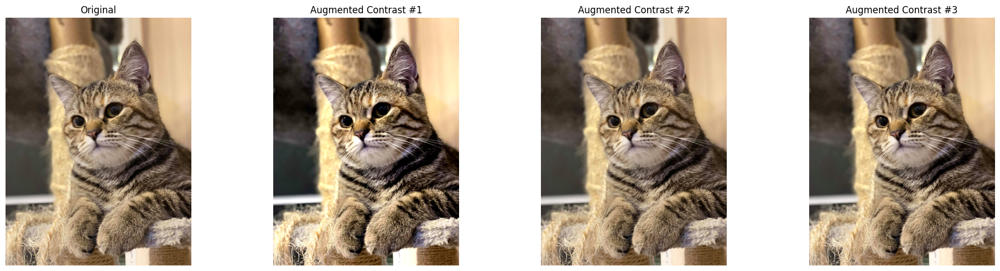

In [41]:
# Contrast Randomisation

# สร้าง Layer สำหรับ Random Contrast
contrast_layer = tf.keras.layers.RandomContrast(factor=0.4)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = contrast_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Contrast #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

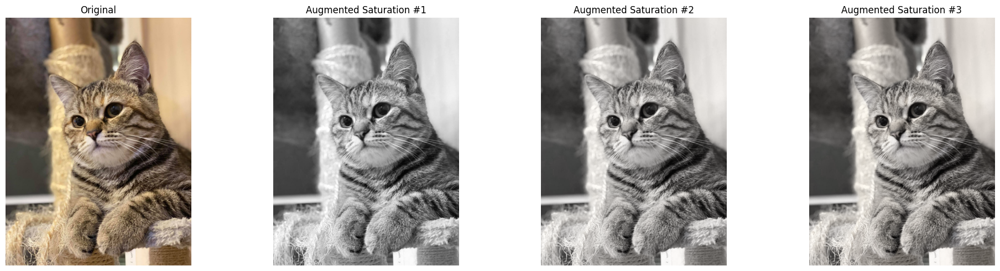

In [42]:
# Saturation randomisation

# สร้าง Layer สำหรับ Random Saturation
saturation_layer = tf.keras.layers.RandomSaturation(factor=0.3)

fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = saturation_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Saturation #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

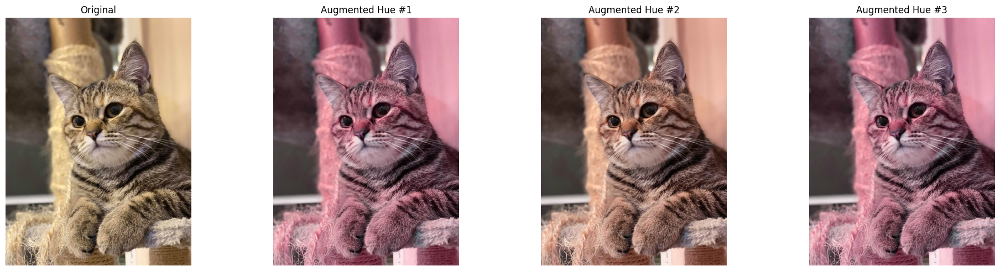

In [43]:
# Hue reandomisation

# สร้าง Layer สำหรับ Random Hue
hue_layer = tf.keras.layers.RandomHue(factor=0.3)

# --- Plot ผลลัพธ์ ---
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
ax[0].imshow(cat)
ax[0].set_title('Original')
ax[0].axis('off')

for i in range(1, 4):
    augmented_batch = hue_layer(img_batch, training=True)
    augmented_image = tf.cast(augmented_batch[0], dtype=tf.uint8).numpy()
    ax[i].imshow(augmented_image)
    ax[i].set_title(f'Augmented Hue #{i}')
    ax[i].axis('off')

plt.tight_layout()
plt.show()

In [44]:
# Definiting a model

input_shape=(32, 32, 3)
inputs = Input(shape=input_shape)

data_augmentation = models.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.1),
    ],
    name="data_augmentation",
)

# นำ Input ไปผ่าน Augmentation Layers ก่อน
x = data_augmentation(inputs)

# Feature Extraction Layers
x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)

# Classification Layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)

# กำหนด Output Layer
outputs = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)

# ประกาศว่าโมเดลนี้มีจุดเริ่มต้น (inputs) และจุดสิ้นสุด (outputs)
model = models.Model(inputs=inputs, outputs=outputs)

In [45]:
# Compiling a model

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [46]:
# Model training

EPOCHS = 120

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - accuracy: 0.3016 - loss: 1.9068 - val_accuracy: 0.4559 - val_loss: 1.5058
Epoch 2/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.4750 - loss: 1.4620 - val_accuracy: 0.5225 - val_loss: 1.3371
Epoch 3/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.5183 - loss: 1.3632 - val_accuracy: 0.5816 - val_loss: 1.1817
Epoch 4/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5389 - loss: 1.2966 - val_accuracy: 0.5783 - val_loss: 1.2009
Epoch 5/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5605 - loss: 1.2503 - val_accuracy: 0.5892 - val_loss: 1.1953
Epoch 6/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5760 - loss: 1.2100 - val_accuracy: 0.6126 - val_loss: 1.1194
Epoch 7/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.5896 - loss: 1.1755 - val_accuracy: 0.6314 - val_loss: 1.0755
Epoch 8/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5962 - loss: 1.1563 - val_acc

In [48]:
# Graph plotting

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()

In [49]:
# Model evaluation

test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"\nTest accuracy = {test_acc}")

313/313 - 1s - 4ms/step - accuracy: 0.6964 - loss: 0.9809

Test accuracy = 0.696399986743927


In [50]:
# Dropout

In [52]:
# Model definiting

input_shape = (32, 32, 3)

data_augmentation = models.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.1),
    ],
    name="data_augmentation",
)

inputs = Input(shape=input_shape)
x = data_augmentation(inputs)

# Feature Extraction Layers
x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)

# Classification Layers
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)

# ตำแหน่งที่เพิ่ม Dropout
x = tf.keras.layers.Dropout(0.2)(x)

outputs = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = models.Model(inputs=inputs, outputs=outputs)

In [53]:
# Compiling a model

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [54]:
# Model training

EPOCHS = 120

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.2691 - loss: 1.9814 - val_accuracy: 0.4445 - val_loss: 1.5630
Epoch 2/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4243 - loss: 1.5869 - val_accuracy: 0.5149 - val_loss: 1.3574
Epoch 3/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.4669 - loss: 1.4866 - val_accuracy: 0.5237 - val_loss: 1.3332
Epoch 4/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4869 - loss: 1.4158 - val_accuracy: 0.5644 - val_loss: 1.2291
Epoch 5/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.5154 - loss: 1.3646 - val_accuracy: 0.5730 - val_loss: 1.2140
Epoch 6/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.5243 - loss: 1.3260 - val_accuracy: 0.5951 - val_loss: 1.1539
Epoch 7/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5321 - loss: 1.3101 - val_accuracy: 0.5935 - val_loss: 1.1729
Epoch 8/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5438 - loss: 1.2736 - val_accu

In [56]:
# Graph plotting

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()

In [58]:
# Model Accuracy

test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"\nTest accuracy = {test_acc}")

313/313 - 1s - 4ms/step - accuracy: 0.7009 - loss: 0.8754

Test accuracy = 0.7009000182151794


In [59]:
# Label Smoothing

In [61]:
# Equations
#y_smooth = (1 - α) × y_hard + α/K

# α (Alpha) = Smoothing parameter (เช่น 0.1)
# K = จำนวน Classes ทั้งหมด
# y_hard = Original one-hot label
# y_smooth = Smoothed label

In [62]:
# Model definition

input_shape = (32, 32, 3)

data_augmentation = models.Sequential(
    [
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.1),
    ],
    name="data_augmentation",
)

inputs = Input(shape=input_shape)
x = data_augmentation(inputs)

x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D((2, 2))(x)

x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(64, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)
model = models.Model(inputs=inputs, outputs=outputs)

In [63]:
# Model compiling

# สร้าง Loss Function object พร้อมกำหนดค่า Label Smoothing
loss_function = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1)

model.compile(optimizer='adam', loss=loss_function, metrics=['accuracy'])

model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 30, 30, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 15, 15, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 167,562 (654.54 KB)

 Trainable params: 167,562 (654.54 KB)

 Non-trainable params: 0 (0.00 B)

In [64]:
# Training a model

EPOCHS = 120

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    validation_data=(x_val, y_val))

Epoch 1/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.2543 - loss: 2.0735 - val_accuracy: 0.4498 - val_loss: 1.6848
Epoch 2/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4123 - loss: 1.7709 - val_accuracy: 0.5079 - val_loss: 1.5805
Epoch 3/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.4571 - loss: 1.6837 - val_accuracy: 0.5382 - val_loss: 1.5173
Epoch 4/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4739 - loss: 1.6510 - val_accuracy: 0.5422 - val_loss: 1.5073
Epoch 5/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.4911 - loss: 1.6132 - val_accuracy: 0.5645 - val_loss: 1.4737
Epoch 6/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.5109 - loss: 1.5795 - val_accuracy: 0.5663 - val_loss: 1.4781
Epoch 7/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5225 - loss: 1.5547 - val_accuracy: 0.5853 - val_loss: 1.4291
Epoch 8/120
400/400 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.5365 - loss: 1.5265 - val_accu

In [65]:
# Graph plotting

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

# สร้างช่วงของจำนวน epochs (เริ่มจาก 1)
epochs_range = range(1, len(acc) + 1)

# สร้าง Subplots 1 แถว 2 คอลัมน์
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=('Training and Validation Loss',
                                    'Training and Validation Accuracy'))

# กราฟที่ 1 Training & Validation Loss
# เพิ่มเส้น Training Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=loss,
                         mode='lines', name='Training Loss'), row=1, col=1)
# เพิ่มเส้น Validation Loss
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_loss,
                         mode='lines', name='Validation Loss'), row=1, col=1)

# กราฟที่ 2 Training & Validation Accuracy
# เพิ่มเส้น Training Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=acc,
                         mode='lines', name='Training Accuracy'), row=1, col=2)

# เพิ่มเส้น Validation Accuracy
fig.add_trace(go.Scatter(x=list(epochs_range), y=val_acc,
                         mode='lines', name='Validation Accuracy'), row=1, col=2)

# ปรับปรุง Layout และตั้งชื่อแกน
fig.update_layout(title_text='Model Training History', height=400, width=1000)

fig.update_xaxes(title_text='Epoch', row=1, col=1)
fig.update_xaxes(title_text='Epoch', row=1, col=2)

fig.update_yaxes(title_text='Loss', row=1, col=1)
fig.update_yaxes(title_text='Accuracy', row=1, col=2)

fig.show()

In [66]:
# Accuracy

test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"\nTest accuracy = {test_acc}")

313/313 - 1s - 4ms/step - accuracy: 0.7013 - loss: 1.2071

Test accuracy = 0.7013000249862671
